<font size=7> Histologies

# <font color="grey">Setup

In [27]:
import pickle 
#from human_hip.histology import plot_histology, plot_histology_electrode_map
from human_hip.spike_data import read_phy_files, read_autocurated_data

from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import pandas as pd

from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import pandas as pd

In [28]:

def plot_histology(sd, image_path, neuron_color="magenta", electrodes=True, neurons=True, xlim=(0, 3850), ylim=(0, 2100), electrode_mapping=None ):
    """
    Function: Plots histology image with electrodes and neurons overlaid.
    Inputs: 
        sd (SpikeData object): contains the metadata necessary to plot the neurons and electrodes
        image_path (string): path to histology image
        electrodes (True/False): Whether or not to plot electrodes
        neurons (True/Fasle): Whether or not to plot neurons
        neurons (True/Fasle): Whether or not to plot neurons
        xlim, ylim (tuple): x and y limits of the plot. Defaults to the dimensions of the MEA
    Outputs:
        Displays a plot of the histology image with electrodes and neurons overlaid
    """
                                                
    # Add background image
    plt.figure(figsize=(15,10))       # Set image size to roughly the shape of the MEA
    img = plt.imread(image_path)      # Load in image
    plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

    # Plot electrodes
    if electrodes:        # Get electrode positions from metadata, the plot them
        if electrode_mapping is None:
            electrode_mapping =  pd.DataFrame.from_dict( sd.metadata[0], orient="index", columns=['x','y']  ) 
        plt.scatter( electrode_mapping.x.values, electrode_mapping.y.values, s=4, c='darkorange')

    # plot neurons
    if neurons:            # Get neuron positions from metadata, then plot them
        neuron_x = []
        neuron_y = []
        for key,val in sd.neuron_data[0].items():
            neuron_x.append( val["position"][0] )
            neuron_y.append( val["position"][1] )
        plt.scatter( neuron_x, neuron_y,  c=neuron_color, alpha=.8, s=50 )  

    #add legend, axises limits, labels,  and title
    legend_elements = [Patch(facecolor="darkorange"), Patch(facecolor=neuron_color) ]   # Create colors in legend
    plt.legend(legend_elements, ["Electrode","Neuron"])       # Add legend
    plt.xlim( xlim[0], xlim[1] )                                       # Set axis limits to that of the MEA
    plt.ylim( ylim[0], ylim[1])
    plt.xlabel('um')                                         # add axises and title
    plt.ylabel('um')
    plt.title(f"Neuron & Electrode Layout")
    plt.show()  



In [29]:

def plot_histology_electrode_map(sd, electrode_mapping, image_path, electrode_color="darkorange", neuron_color="magenta", electrodes=True, neurons=True, xlim=(0, 3850), ylim=(0, 2100) ):
    """
    Function: Plots histology image with electrodes and neurons overlaid.
    Inputs: 
        sd (SpikeData object): contains the metadata necessary to plot the neurons and electrodes
        image_path (string): path to histology image
        electrodes (True/False): Whether or not to plot electrodes
        neurons (True/Fasle): Whether or not to plot neurons
        neurons (True/Fasle): Whether or not to plot neurons
        xlim, ylim (tuple): x and y limits of the plot. Defaults to the dimensions of the MEA
    Outputs:
        Displays a plot of the histology image with electrodes and neurons overlaid
    """
                                                
    # Add background image
    plt.figure(figsize=(15,10))       # Set image size to roughly the shape of the MEA
    img = plt.imread(image_path)      # Load in image
    plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

    # Plot electrodes
    if electrodes:        # Get electrode positions from metadata, the plot them
        plt.scatter( electrode_mapping[:,0], electrode_mapping[:,1], s=4, c=electrode_color)

    # plot neurons
    if neurons:            # Get neuron positions from metadata, then plot them
        neuron_x = []
        neuron_y = []
        for key,val in sd.neuron_data[0].items():
            neuron_x.append( val["position"][0] )
            neuron_y.append( val["position"][1] )
        plt.scatter( neuron_x, neuron_y,  c=neuron_color, alpha=.8, s=50 )  

    #add legend, axises limits, labels,  and title
    if neurons:
        legend_elements = [Patch(facecolor=electrode_color), Patch(facecolor=neuron_color) ]   # Create colors in legend
        plt.legend(legend_elements, ["Electrode","Neuron"])       # Add legend
    else:
        legend_elements = [Patch(facecolor=electrode_color) ]   # Create colors in legend
        plt.legend(legend_elements, ["Electrode"])       # Add legend       
    plt.xlim( xlim[0], xlim[1] )                                       # Set axis limits to that of the MEA
    plt.ylim( ylim[0], ylim[1])
    plt.xlabel('um')                                         # add axises and title
    plt.ylabel('um')
    plt.title(f"Neuron & Electrode Layout")
    plt.show()  



# HC112823


In [2]:
sd = read_autocurated_data( "/workspaces/human_hippocampus/data/ephys/2023-12-03-e-Hc112823_avv9hckcr1/derived/kilosort2/Hc112823_avv9hckcr1_21841_120323_3_acqm.zip" )


In [3]:
with open("/workspaces/human_hippocampus/data/ephys_raw/2023-12-03-e-Hc112823_avv9hckcr1/acid1_start9s_stop28s_fs1ms.pkl", 'rb') as filename:
    data_raw = pickle.load(filename)
print(data_raw.keys())
print(data_raw["data"].shape)

dict_keys(['data', 'xy', 'frame_rate'])
(1009, 19000)


In [4]:
electrode_mapping = data_raw["xy"].copy()
electrode_mapping[:,1] = data_raw["xy"][:,0]/12.5
electrode_mapping[:,0] = data_raw["xy"][:,1]

In [5]:
image_path = "/workspaces/human_hippocampus/data/histology/hc112823.png"

/tmp/ipykernel_82757/533610742.py:12: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


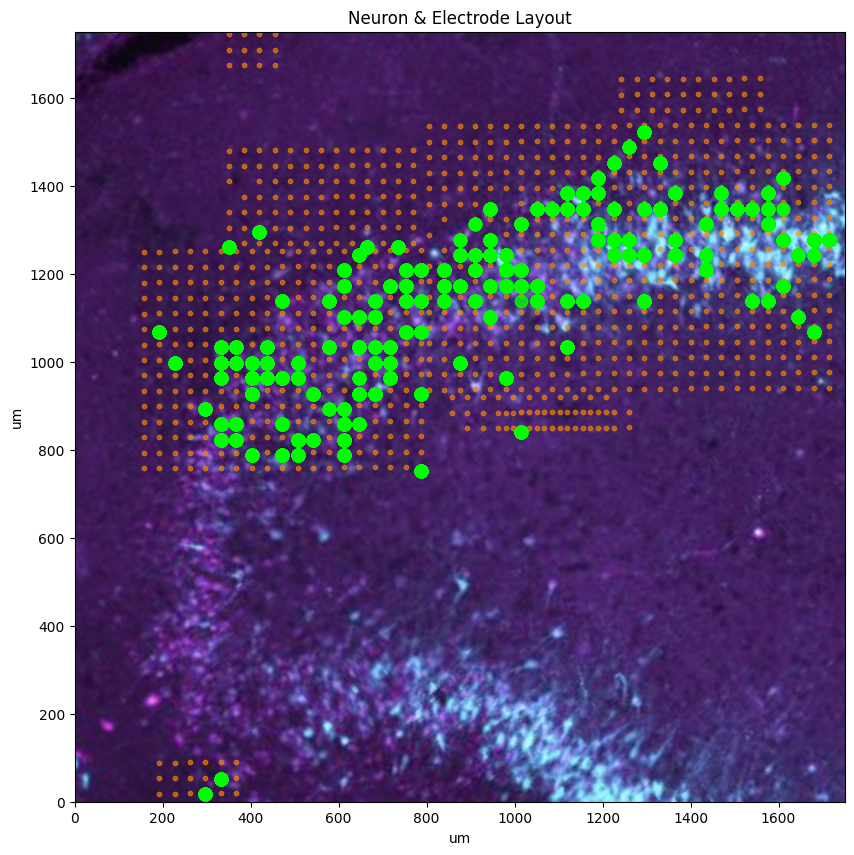

In [8]:
# Add background image
plt.figure(figsize=(15,10))       # Set image size to roughly the shape of the MEA
img = plt.imread(image_path)      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

# Plot electrodes
plt.scatter( electrode_mapping[:,0], electrode_mapping[:,1], s=10, alpha=.6, c="darkorange")

# plot neurons
neuron_x = []
neuron_y = []
for key,val in sd.neuron_data[0].items():
    neuron_x.append( val["position"][0] )
    neuron_y.append( val["position"][1] )
    plt.scatter( neuron_x, neuron_y,  c="lime", alpha=.8, s=80 )  

#add legend, axises limits, labels,  and title
# legend_elements = [Patch(facecolor=electrode_color), Patch(facecolor=neuron_color) ]   # Create colors in legend
# plt.legend(legend_elements, ["Electrode","Neuron"])       # Add legend

plt.xlim( 0, 1750 )                                       # Set axis limits to that of the MEA
plt.ylim( 0, 1750 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout")
plt.show()  

# HC328

In [31]:
#  Load Data
file = open('/workspaces/human_hippocampus/data/ephys/2023-04-02-e-hc328_unperturbed/sd_ca1_curated.pkl', 'rb' )
sd = pickle.load(file)
file.close()

/tmp/ipykernel_82757/437285290.py:30: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


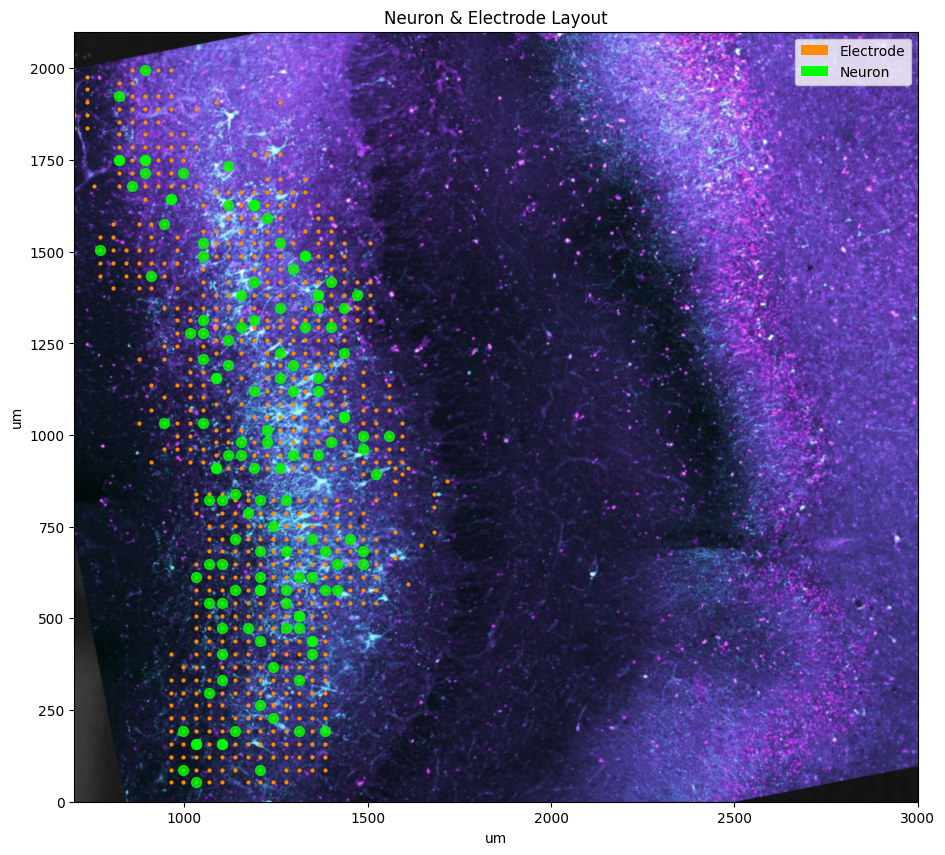

In [32]:
plot_histology(sd, "/workspaces/human_hippocampus/data/histology/hc328.png", neuron_color="lime" , xlim=(700,3000), ylim=(0,2100) )

/tmp/ipykernel_82757/437285290.py:30: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


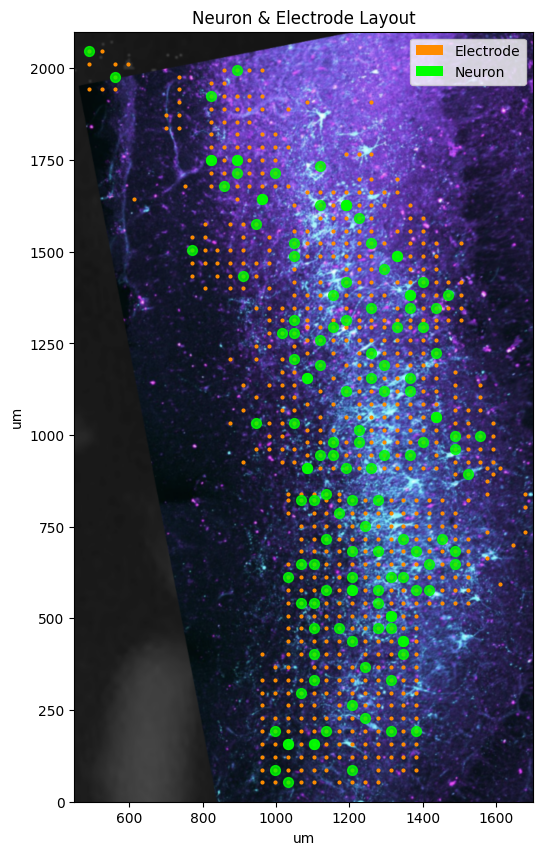

In [33]:
plot_histology(sd, "/workspaces/human_hippocampus/data/histology/hc328.png", neuron_color="lime" , xlim=(450,1700), ylim=(0,2100) )

# HC52

In [35]:
with open('/workspaces/human_hippocampus/data/ephys/2023-05-10-e-hc52_18790_unperturbed/5-10-23s1-CutData.pkl', 'rb' ) as my_file:
    sd = pickle.load(my_file)

/tmp/ipykernel_82757/437285290.py:30: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


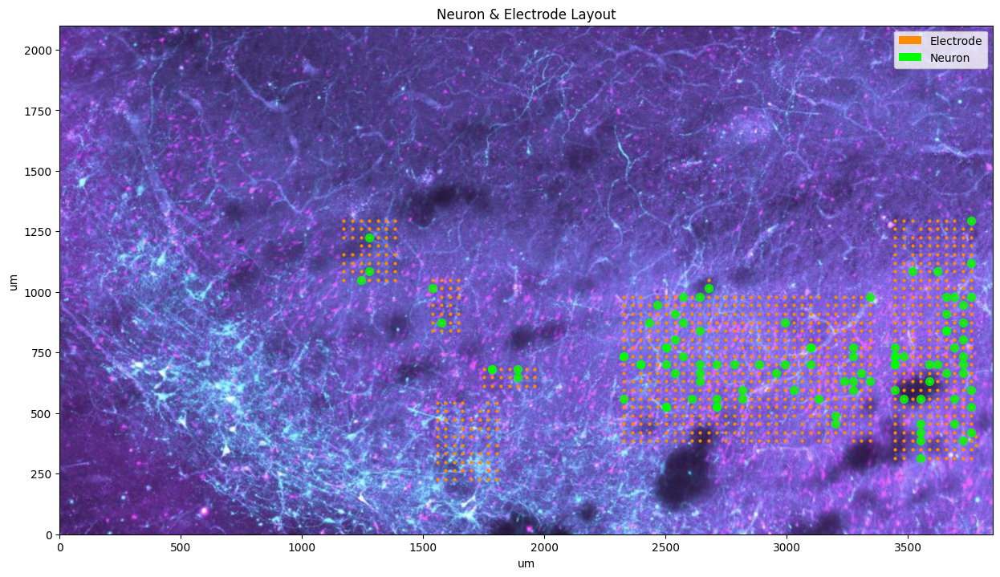

In [36]:
plot_histology(sd, "/workspaces/human_hippocampus/data/histology/hc52.png", neuron_color="lime" )

# Chip 21769

In [38]:
sd = read_phy_files("/workspaces/human_hippocampus/data/ephys/2023-12-11-e-Hc120523_aav9hckcr1_chip21769/elliott/elliott_chip21769_2.zip")


/tmp/ipykernel_82757/437285290.py:30: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


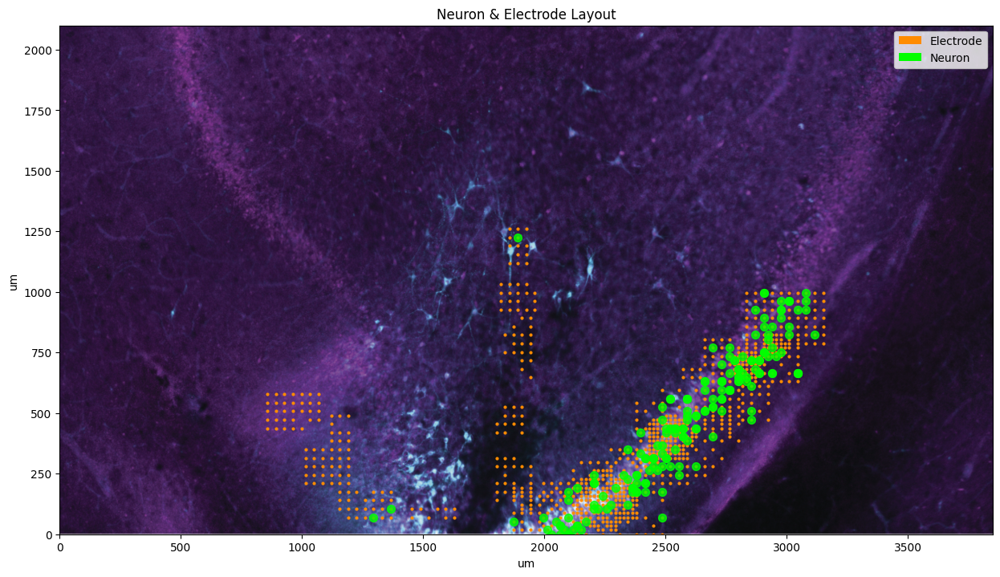

In [39]:
plot_histology(sd, "/workspaces/human_hippocampus/data/histology/chip21769.png", neuron_color="lime")

# HC111

In [41]:
sd = read_phy_files( "/workspaces/human_hippocampus/data/ephys/2022-11-02-e-Hc11.1-chip16753/derived/kilosort2/hc11.1_plated-11.1_chip-16753_rec_11.2.22AM-immediate_curated.zip" )

/tmp/ipykernel_82757/437285290.py:30: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


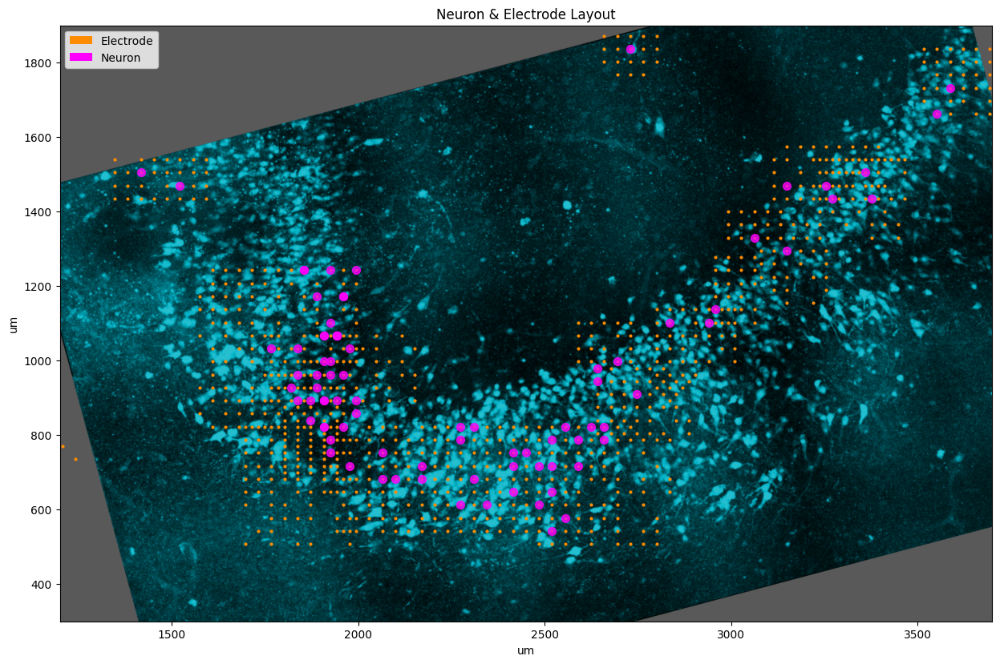

In [43]:
plot_histology(sd, "/workspaces/human_hippocampus/data/histology/dg_adult.png", xlim=(1200,3700), ylim=(300,1900) )

/tmp/ipykernel_82757/437285290.py:30: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


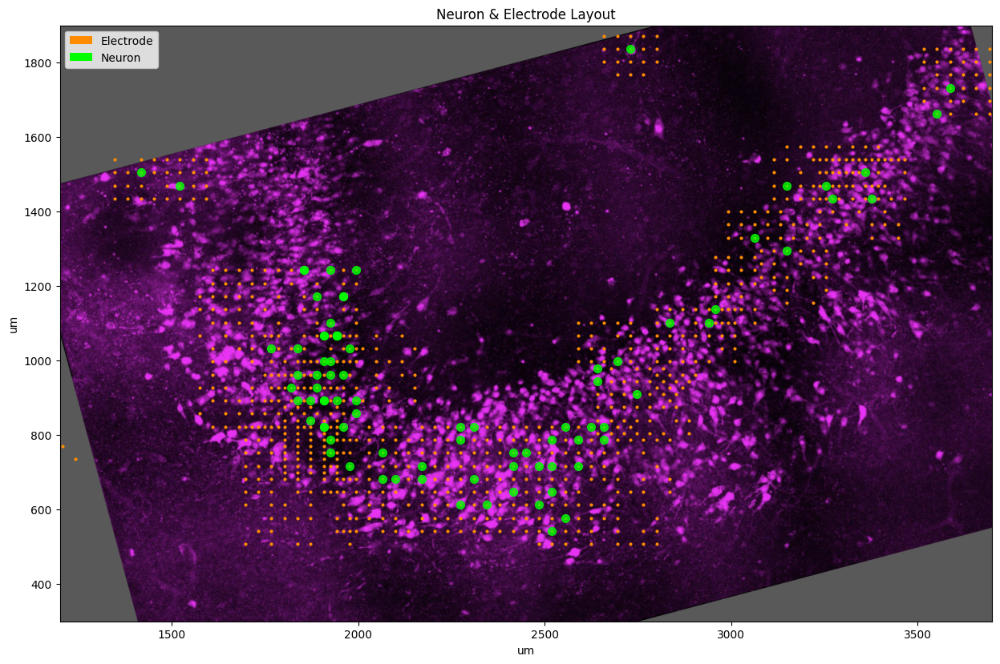

In [42]:
plot_histology(sd, "/workspaces/human_hippocampus/data/histology/dg_adult_pink.png", xlim=(1200,3700), ylim=(300,1900), neuron_color="lime" )

# HC110723

In [44]:
with open("/workspaces/human_hippocampus/data/ephys/2023-11-13-e-Hc110723_hckcr1_21841/hc110723_sd.pkl", "rb") as f:
    sd = pickle.load(f)

/tmp/ipykernel_82757/437285290.py:30: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


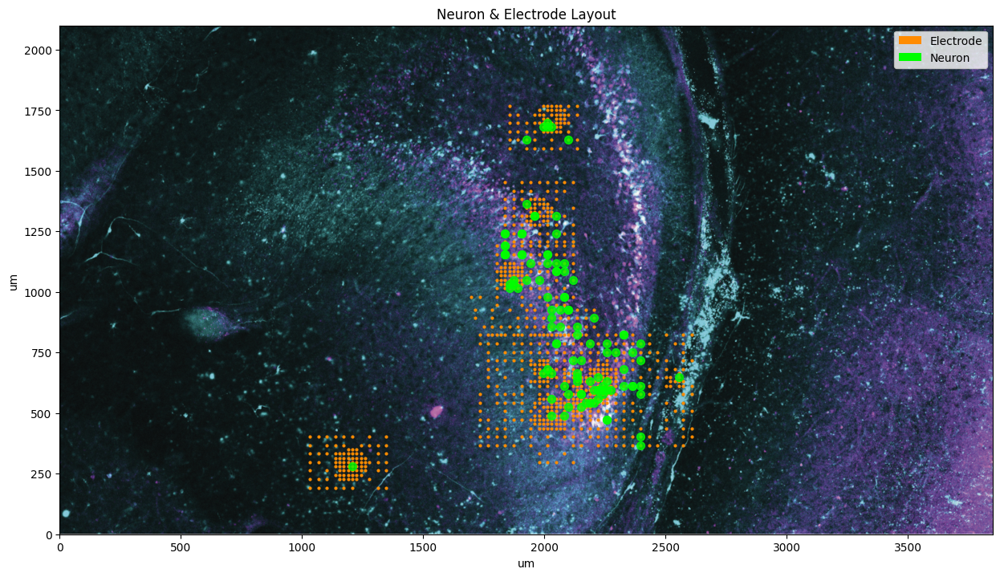

In [45]:
plot_histology(sd, "/workspaces/human_hippocampus/data/histology/hc110723.png", neuron_color="lime") #, xlim=(450,1700), ylim=(0,2100) )